In [18]:
import numpy as np
from run_gather import run_temperature_sweep

temperatures = np.linspace(0, 1, 100)
filenames= [f'temp_sweep3/temperature_{temperature:.2f}' for temperature in temperatures]

default_params = dict(
    num_points=500,
    num_eval=50,
    timestep=0.1,
    parallel=False,
    num_procs=None,
    dtype='float32',
    coupling_radius=3,
    coupling_sum=None,
    init=None,
    verbose=True,
    log=True,
    seed=1234567890, # 1234567890 - ensure same starting state when comparing
    print_tqdm=False,
    skip_prompt=True,
    overwrite_old_file=True,
)


In [19]:
run_temperature_sweep(temperatures, default_params, filenames)

running 100 simulations, the following is for *each* simulation:
running...


0it [00:00, ?it/s]

In [20]:
from analysis import magnetization

#temp_dict = {}# load the results into temp_dict
magnetization_temp = {}
for temperature, filename in zip(temperatures, filenames):
    results = np.load(f'data/2023-04-22/{filename}.npy')
    magnetization_temp[temperature] = magnetization(np.tanh(results[-1]))

import util
t_eval = util.get_t_eval_from_filename(f'data/2023-04-22/{filenames[0]}')


In [9]:
temp_dict[temperatures[0]][-1].shape

(100, 100)

Text(0, 0.5, 'Magnetization')

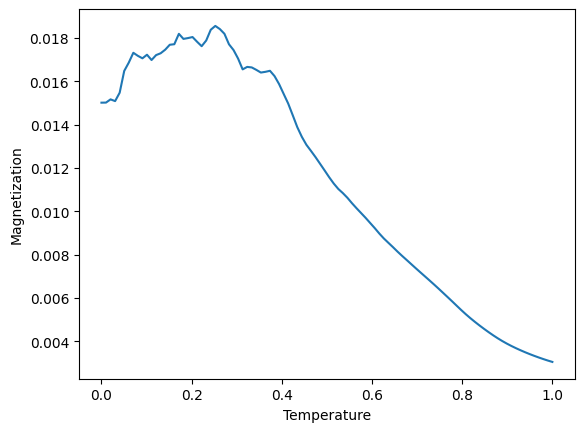

In [21]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure()
plt.plot(temperatures, [magnetization_temp[temperature] for temperature in temperatures])

plt.xlabel('Temperature')
plt.ylabel('Magnetization')


In [29]:
from plotting import animate_grid

%matplotlib notebook
results = np.load(f'data/2023-04-22/{filenames[50]}.npy')
animate_grid(results, plot_idx=1, time=t_eval, plot_every=2, title='Example Simulation')

<IPython.core.display.Javascript object>